## GC Insight- EGU Abstracts Code

This notebook holds the code for analyzing EGU abstracts from 2020-2024.

* Compute embeddings for each abstract
* Visualize abstracts as UMAP
* Compare computational clustering of sessions to session structure
* Simulate how many of similar abstracts are not in same session with simulation and semantic similarity approach

Authors: Jan Sodoge,  Taís Maria Nunes Carvalho


In [ ]:
#install sentence embedding package
!pip install -U sentence-transformers
!pip install umap-learn
!pip install ptitprince

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 255.8/255.8 kB 16.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 283.1/283.1 kB 20.1 MB/s eta 0:00:00
  Created wheel for ptitprince: filename=ptitprince-0.2.7-py3-none-any.whl size=10655 sha256=a1cd8d77ee2e38805f9eca9590ff9b9df4f439b9f7f0ca62317eca0d28b961ad
  Stored in directory: /root/.cache/pip/wheels/0e/43/31/e76a3bf61865543f076a9d9eb027a740caefb379424ecba4e8
Successfully built ptitprince
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.2
    Uninstalling seaborn-0.13.2:
      Successfully uninstalled seaborn-0.13.2


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
from sentence_transformers import SentenceTransformer
import pickle
import umap
import numpy as np
import random
import re
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
import seaborn as sns
import ptitprince as pt
import plotly.express as px

/usr/local/lib/python3.10/dist-packages/sentence_transformers/cross_encoder/CrossEncoder.py:13: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange


In [ ]:
#load abstracts for 2020-2023
abstracts_2020_2023 = pd.read_parquet("/content/drive/MyDrive/Colab Notebooks/gc_insight/egu_abstracts_2020_2023.parquet")
abstracts_2024 = pd.read_parquet("/content/drive/MyDrive/Colab Notebooks/gc_insight/egu_24.parquet")

abstracts_2024['egu_year'] = 2024

abstracts = pd.concat([abstracts_2020_2023, abstracts_2024])

#rempve those short, no present or any other weirdo abstracts
abstracts = abstracts[abstracts['text'].str.len() > 50]
#create a unique ID for each abstract
abstracts['abstract_id'] = abstracts[['id_doc', 'egu_year']].astype(str).agg('-'.join, axis=1)

#use roberta model because of max tokens is suitable for the abstract length (512 tokens)
model = SentenceTransformer("all-distilroberta-v1")
embeddings = model.encode(abstracts.text.tolist(), show_progress_bar = True)


with open("/content/drive/MyDrive/Colab Notebooks/gc_insight/egu_abstracts_2020_2024.pkl", "wb") as fOut:
    pickle.dump({'sentences': abstracts.abstract_id, 'embeddings': embeddings},fOut)


abstracts['embedding'] = [embedding for embedding in embeddings]  # Store embeddings as lists


abstracts.to_parquet("/content/drive/MyDrive/Colab Notebooks/gc_insight/egu_abstracts_2020_2024_w_embeddings.parquet")

#load the parquet file to run the analysis
abstracts = pd.read_parquet("/content/drive/MyDrive/Colab Notebooks/gc_insight/egu_abstracts_2020_2024_w_embeddings.parquet")

In [ ]:

#extract the sessions and program groups
disciplinary_sessions = ["ITS","AS", "BG", "CL", "CR", "EMRP", "ERE", "ESSI",  "GD", "GI", "GM",
 "GMPV", "HS", "NH", "NP", "OS", "PS", "SM", "SSP", "SSS", "ST", "TS","G"]

def find_disciplinary_session(text):
    text = str(text)
    for session in disciplinary_sessions:
        if re.search(rf'{session}\d+', text):
            return session
    return None

abstracts['disciplinary_session'] = abstracts['session'].apply(find_disciplinary_session)
abstracts = abstracts[abstracts['disciplinary_session'].isin(disciplinary_sessions)]
filtered_abstracts = abstracts[abstracts['disciplinary_session'] != 'ITS']
abstracts['disciplinary_session'].value_counts()

,count
disciplinary_session,
HS,11213
AS,8069
CL,5619
NH,5495
BG,5199
OS,4608
SSS,4107
ITS,3663
GM,3164


In [ ]:
from sentence_transformers import util  # use this for sbert similarity of embeddings

def pick_random_abstract(abstracts):
    random_idx = random.randint(0, len(abstracts) - 1)
    random_abstract = abstracts.iloc[random_idx]
    random_embedding = np.array(random_abstract['embedding'])
    random_session = random_abstract['disciplinary_session']
    return random_idx, random_embedding, random_session


def calculate_similarities(abstracts, random_embedding):
    all_embeddings = np.vstack(abstracts['embedding'].values)  # Convert list of embeddings to a 2D numpy array
    similarities = util.pytorch_cos_sim(random_embedding, all_embeddings).cpu().numpy()[0]  # SBERT similarity calculation
    return similarities


def find_most_similar(similarities, random_idx, top_n=20):
    similarities[random_idx] = -1  # Exclude the randomly picked abstract itself
    most_similar_idx = np.argsort(similarities)[-top_n:]  # Get the indices of the top N similar abstracts
    return most_similar_idx

def calculate_share_same_session(abstracts, most_similar_idx, random_session):
    same_session_count = sum(abstracts.iloc[most_similar_idx]['disciplinary_session'] == random_session)
    return same_session_count / len(most_similar_idx)

def repeat_random_sampling(abstracts, iterations=100, top_n=10):
    shares_by_session = {}

    for _ in range(iterations):
        random_idx, random_embedding, random_session = pick_random_abstract(abstracts)
        similarities = calculate_similarities(abstracts, random_embedding)
        most_similar_idx = find_most_similar(similarities, random_idx, top_n=top_n)
        share = calculate_share_same_session(abstracts, most_similar_idx, random_session)
        if random_session not in shares_by_session:
            shares_by_session[random_session] = []
        shares_by_session[random_session].append(share)

    return shares_by_session



# Main func
def analyze_similar_abstracts_repeated(abstracts, iterations=100, top_n=10):

    return repeat_random_sampling(abstracts, iterations=iterations, top_n=top_n)


In [ ]:
filtered_abstracts_2020 = filtered_abstracts[filtered_abstracts['egu_year'] == 2020]
filtered_abstracts_2021 = filtered_abstracts[filtered_abstracts['egu_year'] == 2021]
filtered_abstracts_2022 = filtered_abstracts[filtered_abstracts['egu_year'] == 2022]
filtered_abstracts_2023 = filtered_abstracts[filtered_abstracts['egu_year'] == 2023]
filtered_abstracts_2024 = filtered_abstracts[filtered_abstracts['egu_year'] == 2024]


sampling_abstracts_results_a = analyze_similar_abstracts_repeated(filtered_abstracts_2020,
                                                                iterations=5000, top_n=10)
sampling_abstracts_results_b = analyze_similar_abstracts_repeated(filtered_abstracts_2021,
                                                                iterations=5000, top_n=10)
sampling_abstracts_results_c = analyze_similar_abstracts_repeated(filtered_abstracts_2022,
                                                                iterations=5000, top_n=10)
sampling_abstracts_results_d = analyze_similar_abstracts_repeated(filtered_abstracts_2023,
                                                                iterations=5000, top_n=10)
sampling_abstracts_results_e = analyze_similar_abstracts_repeated(filtered_abstracts_2024,
                                                                iterations=5000, top_n=10)


def merge_multiple_sampling_results(*results_lists):
    merged_results = results_lists[0].copy()  # Make a copy of the first list

    for results in results_lists[1:]:
        for session, shares in results.items():
            if session in merged_results:
                merged_results[session].extend(shares)
            else:
                merged_results[session] = shares

    return merged_results

merged_sampling_results = merge_multiple_sampling_results(
    sampling_abstracts_results_a,
    sampling_abstracts_results_b,
    sampling_abstracts_results_c,
    sampling_abstracts_results_d,
    sampling_abstracts_results_e
)

# Save stuff
with open("/content/drive/MyDrive/Colab Notebooks/gc_insight/simulation_results.pkl", 'wb') as f:
    pickle.dump(merged_sampling_results, f)

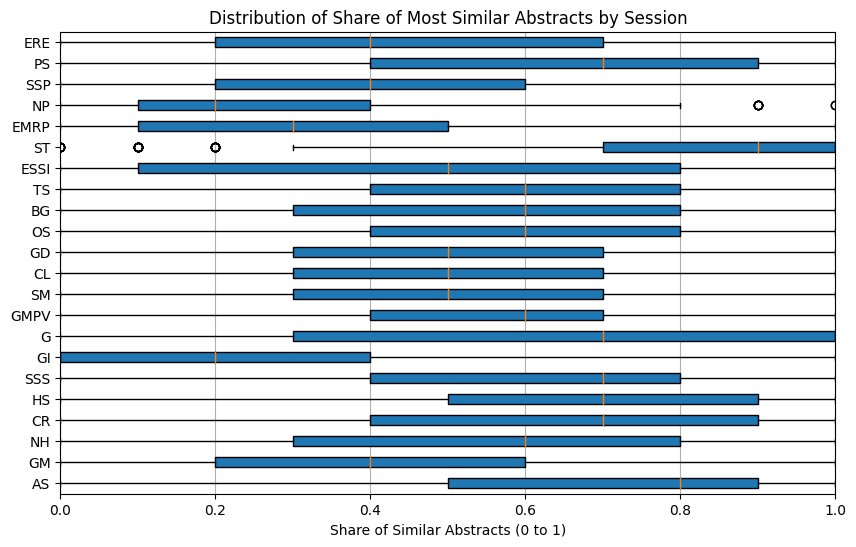

In [ ]:
#with open("/content/drive/MyDrive/Colab Notebooks/gc_insight/simulation_results.pkl", 'rb') as f:
with open("/content/drive/MyDrive/0. Postdoc/gc_insight/simulation_results.pkl", 'rb') as f:
    loaded_results = pickle.load(f)


plt.figure(figsize=(10, 6))

box_data = [shares for shares in loaded_results.values()]
session_labels = list(loaded_results.keys())
box = plt.boxplot(box_data, vert=False, patch_artist=True, labels=session_labels)
plt.title('Distribution of Share of Most Similar Abstracts by Session')
plt.xlabel('Share of Similar Abstracts (0 to 1)')
plt.xlim(0, 1)
plt.grid(axis='x')
plt.show()

In [ ]:
division_colors = {
    "Earth Magnetism & Rock Physics": "#a8322d",
    "Geodynamics": "#b8382b",
    "Tectonics & Structural Geology": "#db6a29",
    "Seismology": "#aa4c71",
    "Geochemistry, Mineralogy, Petrology & Volcanology": "#db3c39",
    "Natural Hazards": "#a86624",
    "Stratigraphy, Sedimentology & Palaeontology": "#cfa840",
    "Cryospheric Sciences": "#2f8fc3",
    "Ocean Sciences": "#3d72bc",
    "Hydrological Sciences": "#53a75a",
    "Geomorphology": "#607f6c",
    "Energy, Resources & Environment": "#617e47",
    "Biogeosciences": "#51743e",
    "Soil System Sciences": "#74592d",
    "Nonlinear Processes in Geosciences": "#2b3953",
    "Atmospheric Sciences": "#4c4bab",
    "Earth & Space Science Informatics": "#70598d",
    "Geodesy": "#805789",
    "Climate: Past, Present & Future": "#9b4d7d",
    "Planetary & Solar System Sciences": "#995270",
    "Solar-Terrestrial Sciences": "#85604f",
    "Geosciences Instrumentation & Data Systems": "#7a7a74"
}

In [ ]:
acronym_colors = {
    "EMRP": "#a8322d",  # Earth Magnetism & Rock Physics
    "GD": "#b8382b",    # Geodynamics
    "TS": "#db6a29",    # Tectonics & Structural Geology
    "SM": "#aa4c71",    # Seismology
    "GMPV": "#db3c39",  # Geochemistry, Mineralogy, Petrology & Volcanology
    "NH": "#a86624",    # Natural Hazards
    "SSP": "#cfa840",   # Stratigraphy, Sedimentology & Palaeontology
    "CR": "#2f8fc3",    # Cryospheric Sciences
    "OS": "#3d72bc",    # Ocean Sciences
    "HS": "#53a75a",    # Hydrological Sciences
    "GM": "#607f6c",    # Geomorphology
    "ERE": "#617e47",   # Energy, Resources & Environment
    "BG": "#51743e",    # Biogeosciences
    "SSS": "#74592d",   # Soil System Sciences
    "NP": "#2b3953",    # Nonlinear Processes in Geosciences
    "AS": "#4c4bab",    # Atmospheric Sciences
    "ESSI": "#70598d",  # Earth & Space Science Informatics
    "G": "#805789",     # Geodesy
    "CL": "#9b4d7d",    # Climate: Past, Present & Future
    "PS": "#995270",    # Planetary & Solar System Sciences
    "ST": "#85604f",    # Solar-Terrestrial Sciences
    "GI": "#7a7a74"     # Geosciences Instrumentation & Data Systems
}

/usr/local/lib/python3.10/dist-packages/seaborn/_core.py:1462: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)
/usr/local/lib/python3.10/dist-packages/seaborn/_core.py:1462: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


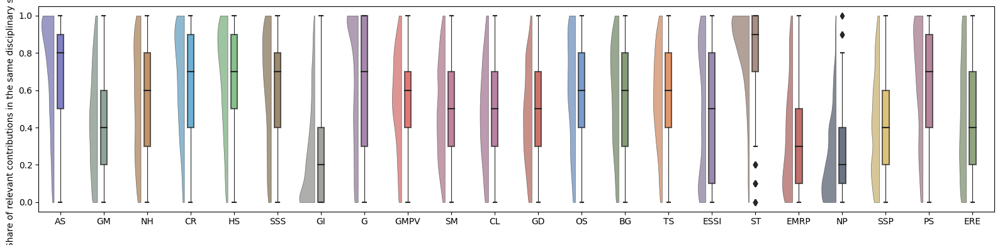

In [ ]:
# Initialize lists for plotting
values = []
categories = []
colors = []

# Prepare the data for plotting
for category, val_list in loaded_results.items():
    values.extend(val_list)  # Collect all the values
    categories.extend([category] * len(val_list))  # Associate each value with its key
    # Get the corresponding color for each category
    colors.extend([acronym_colors[category]])

ort = "v"

# Create the half violin plot
plt.figure(figsize=(16, 4))  # Adjust figure size as needed

ax=pt.half_violinplot(x=categories, y=values, palette=colors, bw=.25,  linewidth=0.5, cut=0.,
                   scale="area", width=.8, inner=None, orient=ort, alpha=0.6)
ax=sns.boxplot(x=categories, y=values, palette=colors, orient=ort, width=.15, zorder=10,
               boxprops=dict(alpha=.7),
              #showcaps=True, boxprops={'facecolor':'none', "zorder":10},
              showfliers=True, whiskerprops={'linewidth':0.8, "zorder":10}, saturation=1)

ax.legend_.remove() if ax.legend_ else None

# Add titles and labels
plt.xlabel(" ")
plt.ylabel("Share of relevant contributions in the same disciplinary session")
plt.xticks(rotation=0)
plt.tight_layout()

Boxplots ordered by the median

/usr/local/lib/python3.10/dist-packages/seaborn/_core.py:1462: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)
/usr/local/lib/python3.10/dist-packages/seaborn/_core.py:1462: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


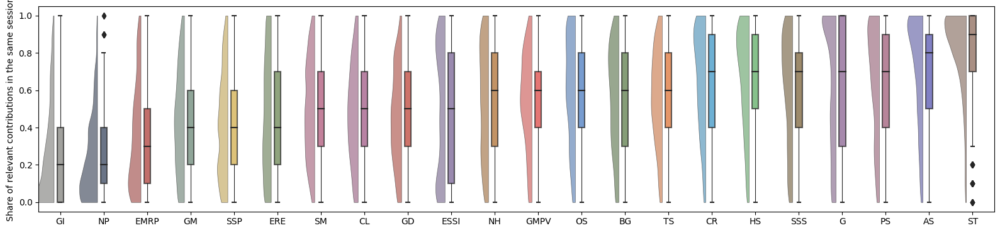

In [ ]:
# Calculate average values for sorting
average_values = {category: np.median(val_list) for category, val_list in loaded_results.items()}

# Sort categories based on their average values
sorted_categories = sorted(average_values, key=average_values.get)

# Create a mapping for the sorted categories
category_order = {category: idx for idx, category in enumerate(sorted_categories)}
sorted_colors = [acronym_colors[cat] for cat in sorted_categories]

# Create the half violin plot
plt.figure(figsize=(16, 4))

# Plot the half violin plot with sorted categories
ax = pt.half_violinplot(x=[category_order[cat] for cat in categories],
                         y=values, palette=sorted_colors, bw=.25,
                         linewidth=0.5, cut=0., scale="area",
                         width=1, inner=None, alpha=0.6)

# Plot the boxplot with sorted categories
sns.boxplot(x=[category_order[cat] for cat in categories],
            y=values, palette=sorted_colors,
            width=.15, zorder=10,
            boxprops=dict(alpha=.7),
            showfliers=True,
            whiskerprops={'linewidth': 0.8, "zorder": 10}, saturation=1)

# Set x-ticks to sorted category names
plt.xticks(ticks=list(category_order.values()), labels=sorted_categories, rotation=0)

# Remove the legend if it exists
ax.legend_.remove() if ax.legend_ else None

# Add titles and labels
plt.xlabel(" ")
plt.ylabel("Share of relevant contributions in the same session")
plt.tight_layout()

# Show the plot
plt.show()

Adding a line with the average across all categories

/usr/local/lib/python3.10/dist-packages/seaborn/_core.py:1462: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)
/usr/local/lib/python3.10/dist-packages/seaborn/_core.py:1462: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


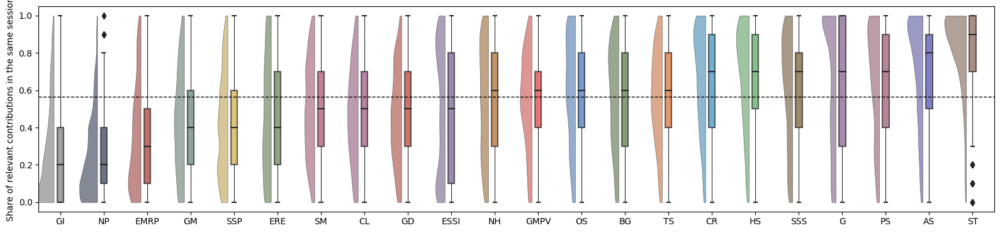

In [ ]:
# Calculate average values for sorting
average_values = {category: np.median(val_list) for category, val_list in loaded_results.items()}

# Sort categories based on their average values
sorted_categories = sorted(average_values, key=average_values.get)

# Create a mapping for the sorted categories
category_order = {category: idx for idx, category in enumerate(sorted_categories)}
sorted_colors = [acronym_colors[cat] for cat in sorted_categories]

# Create the half violin plot
plt.figure(figsize=(16, 4))

# Plot the half violin plot with sorted categories
ax = pt.half_violinplot(x=[category_order[cat] for cat in categories],
                         y=values, palette=sorted_colors, bw=.25,
                         linewidth=0.5, cut=0., scale="area",
                         width=1, inner=None, alpha=0.6)

# Plot the boxplot with sorted categories
sns.boxplot(x=[category_order[cat] for cat in categories],
            y=values, palette=sorted_colors,
            width=.15, zorder=10,
            boxprops=dict(alpha=.7),
            showfliers=True,
            whiskerprops={'linewidth': 0.8, "zorder": 10}, saturation=1)

# Set x-ticks to sorted category names
plt.xticks(ticks=list(category_order.values()), labels=sorted_categories, rotation=0)

# Calculate the overall average value across all categories
overall_average = np.mean(values)

# Add a horizontal line at the overall average
plt.axhline(y=overall_average, color='black', linestyle='--', linewidth=1, label=f'Overall Average ({overall_average:.2f})')

# Add a legend for the overall average line
plt.legend(loc='upper right')

# Remove the legend if it exists
ax.legend_.remove() if ax.legend_ else None

# Add titles and labels
plt.xlabel(" ")
plt.ylabel("Share of relevant contributions in the same session")
plt.tight_layout()

# Show the plot
plt.show()

Adding legend

In [ ]:
# Calculate the counts for each category
category_counts = filtered_abstracts.groupby('disciplinary_session').size()

# Ensure the counts are in the same order as sorted_categories
count_labels = [category_counts[cat] for cat in sorted_categories]

# Create labels that combine the category names and their counts
combined_labels = [f"{cat}\nn={count}" for cat, count in zip(sorted_categories, count_labels)]

# Plot the half violin plot
plt.figure(figsize=(16, 4))

# Plot the half violin plot with sorted categories
ax = pt.half_violinplot(x=[category_order[cat] for cat in categories],
                         y=values, palette=sorted_colors, bw=.25,
                         linewidth=0.5, cut=0., scale="area",
                         width=1, inner=None, alpha=0.4)

# Plot the boxplot with sorted categories
sns.boxplot(x=[category_order[cat] for cat in categories],
            y=values, palette=sorted_colors,
            width=.15, zorder=10,
            boxprops=dict(alpha=.7),
            showfliers=True,
            whiskerprops={'linewidth': 0.8, "zorder": 10}, saturation=1)

# Set x-ticks to combined category names and their counts
plt.xticks(ticks=list(category_order.values()), labels=combined_labels, rotation=0)

# Calculate the overall average value across all categories
overall_average = np.mean(values)

# Add a horizontal line at the overall average
plt.axhline(y=overall_average, color='black', linestyle='--', linewidth=1, label=f'Overall Average ({overall_average:.2f})')

# Add a legend for the overall average line
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False, fontsize=10, title_fontsize='10', handlelength=0)

# Rotate the legend text
for text in plt.gca().get_legend().get_texts():
    text.set_rotation(90)

# Add extra space on the left side
plt.margins(x=0.01)  # Adjust the left margin to your liking

# Add titles and labels
plt.xlabel(" ")
plt.ylabel("Share of relevant contributions in the same session")
plt.tight_layout()

# Save the plot as a high-quality SVG
plt.savefig('/content/drive/MyDrive/0. Postdoc/gc_insight/half_violin_plot.png', format='png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

NameError: name 'sorted_categories' is not defined

/usr/local/lib/python3.10/dist-packages/seaborn/_core.py:1462: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)
/usr/local/lib/python3.10/dist-packages/seaborn/_core.py:1462: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


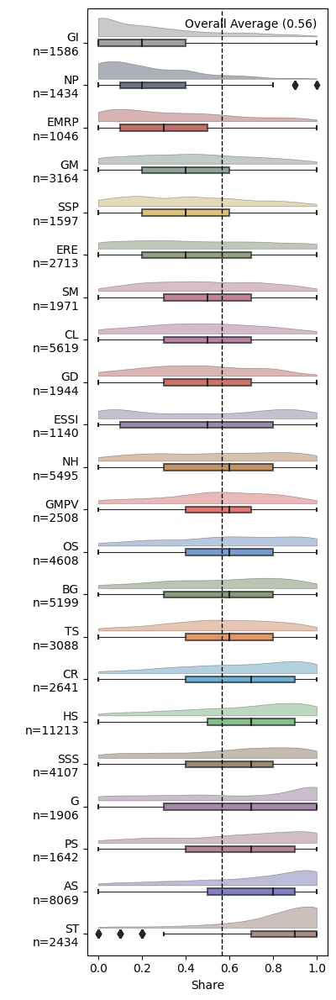

In [ ]:
# Calculate the counts for each category
category_counts = filtered_abstracts.groupby('disciplinary_session').size()

# Ensure the counts are in the same order as sorted_categories
count_labels = [category_counts[cat] for cat in sorted_categories]

# Create labels that combine the category names and their counts
combined_labels = [f"{cat}\nn={count}" for cat, count in zip(sorted_categories, count_labels)]

# Plot the half violin plot
plt.figure(figsize=(4.1, 12))  # Adjusted figure size for vertical orientation

# Plot the half violin plot with sorted categories
ax = pt.half_violinplot(y=[category_order[cat] for cat in categories],
                         x=values, palette=sorted_colors, bw=.25, orient="h",
                         linewidth=0.5, cut=0., scale="area",
                         width=1, inner=None, alpha=0.4)

# Plot the boxplot with sorted categories
sns.boxplot(y=[category_order[cat] for cat in categories],
            x=values, palette=sorted_colors, orient="h",
            width=.15, zorder=10,
            boxprops=dict(alpha=.7),
            showfliers=True,
            whiskerprops={'linewidth': 0.8, "zorder": 10}, saturation=1)

# Set y-ticks to combined category names and their counts
plt.yticks(ticks=list(category_order.values()), labels=combined_labels, rotation=0)

# Calculate the overall average value across all categories
overall_average = np.mean(values)

# Add a vertical line at the overall average
plt.axvline(x=overall_average, color='black', linestyle='--', linewidth=1, label=f'Overall Average ({overall_average:.2f})')

# Add a legend for the overall average line
plt.legend(loc='upper right', frameon=False, fontsize=10, title_fontsize='10', handlelength=0)

# Rotate the legend text
for text in plt.gca().get_legend().get_texts():
    text.set_rotation(0)

# Add extra space on the bottom side
plt.margins(y=0.01)  # Adjust the bottom margin to your liking

# Add titles and labels
plt.ylabel(" ")
plt.xlabel("Share")
plt.tight_layout()

# Save the plot as a high-quality SVG
plt.savefig('/content/drive/MyDrive/0. Postdoc/gc_insight/half_violin_plot_vertical.png', format='png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

In [ ]:
embeddings = np.vstack(filtered_abstracts['embedding'].values)

umap_model = umap.UMAP(n_components=2, random_state=42)
embeddings_2d = umap_model.fit_transform(embeddings)




embeddings_2d_df = pd.DataFrame(embeddings_2d, columns=['embedding_2d_x', 'embedding_2d_y'])

# Concatenate the original DataFrame with the new 2D embeddings DataFrame
filtered_abstracts_with_embeddings = pd.concat([filtered_abstracts.reset_index(drop=True), embeddings_2d_df], axis=1)
filtered_abstracts_with_embeddings.to_parquet("/content/export.parquet")

In [ ]:
# Get unique disciplinary sessions
unique_sessions = filtered_abstracts['disciplinary_session'].unique()

# Create a dictionary to map sessions to colors using the acronym_colors
session_color_map = {session: acronym_colors[session] for session in unique_sessions if session in acronym_colors}

# Map the session colors to the embeddings
point_colors = filtered_abstracts['disciplinary_session'].map(session_color_map)

# Step 5: Visualize the UMAP output with discrete colors
plt.figure(figsize=(10, 8))
plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=point_colors, s=3, alpha=0.2)
# plt.title('UMAP Projection of Abstract Embeddings')  # Uncomment if you want a title

# Remove axes and grids
plt.axis('off')
# plt.grid(False)  # If you need to turn off grids explicitly

plt.tight_layout()

# Create a custom legend
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=session_color_map[session], markersize=10) for session in unique_sessions if session in session_color_map]
plt.legend(handles, unique_sessions, title='Disciplinary Session', loc='upper right', bbox_to_anchor=(1.2, 1))

plt.savefig('/content/drive/MyDrive/0. Postdoc/gc_insight/umap_plot_300dpi.png', format='png', dpi=300, bbox_inches='tight')

plt.show()

In [ ]:
session_labels = abstracts['disciplinary_session'].astype('category').cat.codes  # Convert to numeric codes

silhouette_avg = silhouette_score(embeddings_2d, session_labels)

silhouette_avg

n_clusters = len(abstracts['disciplinary_session'].unique())  # Number of unique sessions as clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans_labels = kmeans.fit_predict(embeddings_2d)

kmeans_silhouette_avg = silhouette_score(embeddings_2d, kmeans_labels)

0.39857087

Interactive visualization

In [ ]:
# Add embedding coordinates and disciplinary session information to DataFrame
df_embeddings = pd.DataFrame(embeddings_2d, columns=['UMAP1', 'UMAP2'])
df_embeddings['disciplinary_session'] = filtered_abstracts['disciplinary_session'].values
df_embeddings['abstract_title'] = filtered_abstracts['title'].values

# Map session colors to the DataFrame
df_embeddings['color'] = df_embeddings['disciplinary_session'].map(session_color_map)

# Create the interactive plot using Plotly
fig = px.scatter(
    df_embeddings,
    x='UMAP1',
    y='UMAP2',
    color='disciplinary_session',  # Use disciplinary session for color
    hover_name='abstract_title',   # Show abstract title on hover
    hover_data={'UMAP1': False, 'UMAP2': False, 'color': False},  # Optionally hide UMAP coordinates from hover
    color_discrete_map=session_color_map,  # Use the custom color map
    title="UMAP Projection of Abstract Embeddings"
)

# Customize the layout (e.g., remove grid and axis)
fig.update_layout(
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(showgrid=False, zeroline=False),
    plot_bgcolor='white'
)

# Remove axis labels
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)

# Show the interactive plot
fig.show()

# Save the plot to an HTML file (to view in a browser)
fig.write_html("/content/drive/MyDrive/0. Postdoc/gc_insight/umap_interactive_plot.html")